In [267]:
import pandas as pd 
from scipy import stats

In [302]:
df = pd.read_csv("train_data.csv")

In [303]:
df.columns

Index(['Period Code', 'Cycle ID', 'B_2', 'B_3', 'B_4', 'B_5', 'B_9', 'B_10',
       'B_14', 'B_15', 'B_16', 'B_17', 'B_18', 'B_19', 'B_20', 'B_21', 'B_22',
       'B_23', 'B_24', 'B_25', 'timestamp', 'Good/Bad'],
      dtype='object')

ValueError: No variables found for grid columns.

In [269]:
for col in df.columns: 
    if col in ['timestamp','Good/Bad']:
        continue
    df[col] = pd.to_numeric(df[col], errors = "coerce")

In [270]:
df.isnull().sum()

Period Code    288
Cycle ID       279
B_2            277
B_3            293
B_4            279
B_5            306
B_9            309
B_10           307
B_14           288
B_15           290
B_16           278
B_17           292
B_18           295
B_19           288
B_20           279
B_21           311
B_22           299
B_23           295
B_24           278
B_25           300
timestamp        0
Good/Bad         0
dtype: int64

In [271]:
# keep a threshhold of 0.7 for 70%
threshold = 0.7
missing_values_per_row = df.isnull().sum(axis=1) / len(df.columns)
rows_to_drop = missing_values_per_row > threshold
df_cleaned = df[~rows_to_drop]

In [272]:
df_cleaned.isnull().sum()

Period Code    288
Cycle ID       279
B_2            277
B_3            293
B_4            279
B_5            306
B_9            309
B_10           307
B_14           288
B_15           290
B_16           278
B_17           292
B_18           295
B_19           288
B_20           279
B_21           311
B_22           299
B_23           295
B_24           278
B_25           300
timestamp        0
Good/Bad         0
dtype: int64

In [273]:
while(True):
    df_cleaned['Cycle ID'] = df_cleaned['Cycle ID'].fillna(df_cleaned['Cycle ID'].shift(1) + 1)
    if(df_cleaned['Cycle ID'].isnull().sum() == 0):
        break


In [274]:
while(True):
    df_cleaned['Period Code'] = df_cleaned['Period Code'].fillna(df_cleaned['Period Code'].shift(1))
    if(df_cleaned['Period Code'].isnull().sum() == 0):
        break

In [275]:
df_cleaned.isnull().sum()

Period Code      0
Cycle ID         0
B_2            277
B_3            293
B_4            279
B_5            306
B_9            309
B_10           307
B_14           288
B_15           290
B_16           278
B_17           292
B_18           295
B_19           288
B_20           279
B_21           311
B_22           299
B_23           295
B_24           278
B_25           300
timestamp        0
Good/Bad         0
dtype: int64

In [276]:
# Define a significance level (alpha)
alpha = 0.05

# Group the data by the 'Cycle ID' column
grouped = df_cleaned.groupby('Period Code')

# Define columns to fill based on your conditions
columns_to_fill = []
for col in df_cleaned.columns:
    if col not in ['Period Code', 'Cycle ID', 'timestamp', 'Good/Bad']:
        columns_to_fill.append(col)

# Calculate means and modes for the specified columns within each group (cycle)
means = grouped[columns_to_fill].mean()
median = grouped[columns_to_fill].median()

# Iterate over each cycle
for cycle, group in grouped:
    for col in columns_to_fill:
        data = group[col].dropna()  # Remove missing values for the current column
        # Check normality using the Kolmogorov-Smirnov test
        if data.empty:
            continue
        stat, p = stats.kstest(data, 'norm')
        
        if p > alpha:
            # Column appears to be normally distributed, fill with the mean
            df_cleaned.loc[group.index, col] = df_cleaned.loc[group.index, col].fillna(means.loc[cycle, col])
        else:
            # Column does not appear to be normally distributed, fill with the mode
            df_cleaned.loc[group.index, col] = df_cleaned.loc[group.index, col].fillna(median.loc[cycle, col])

In [ ]:
df_final = df_cleaned.dropna()

In [277]:
df_cleaned.isnull().sum()

Period Code    0
Cycle ID       0
B_2            0
B_3            0
B_4            0
B_5            0
B_9            0
B_10           0
B_14           0
B_15           0
B_16           0
B_17           0
B_18           0
B_19           0
B_20           0
B_21           0
B_22           0
B_23           0
B_24           0
B_25           0
timestamp      0
Good/Bad       0
dtype: int64

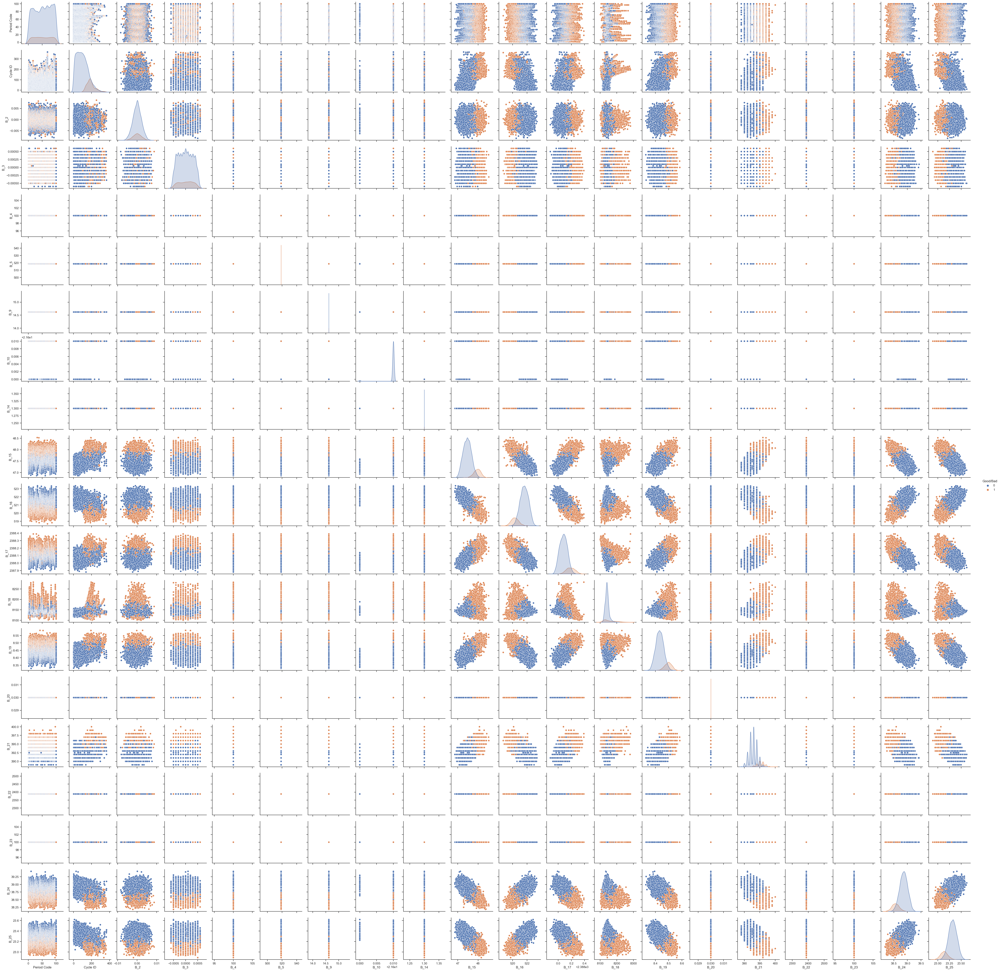

In [307]:
import seaborn as sns
import matplotlib.pyplot as plt

#sns.set(style="ticks")
sns.pairplot(df_cleaned, hue='Good/Bad')
plt.show()

In [280]:
X = df_final.drop(['Good/Bad','timestamp','Period Code','Cycle ID'], axis=1)
y = df_final['Good/Bad']

In [312]:
df = df_final.drop(['timestamp','Period Code','Cycle ID'], axis=1)
y = df_final['Good/Bad']

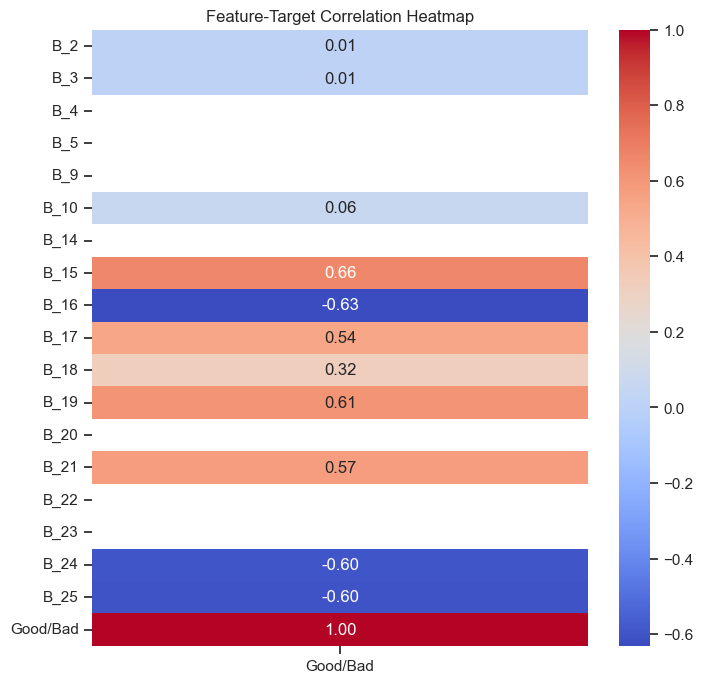

In [322]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame df with your data, and 'target' is your target variable
# Replace 'df' and 'target' with your actual DataFrame and target variable name

# Compute the correlations between features and the target variable
correlation_matrix = df.corr()
correlations_with_target = correlation_matrix['Good/Bad']

# Create a DataFrame with just the correlations with the target
correlation_df = pd.DataFrame(correlations_with_target)

# Create a heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(correlation_df, annot=True, cmap="coolwarm", fmt=".2f", cbar=True)

# Set the title
plt.title("Feature-Target Correlation Heatmap")

# Show the plot
plt.show()

In [296]:
pip install xgboost

In [281]:
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error

In [282]:
model = xgb.XGBClassifier(objective="binary:logistic")
model.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [315]:
importance_scores = model.feature_importances_

In [316]:
importance_scores

array([0.01713164, 0.01936286, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.626492  , 0.06315437, 0.03768056,
       0.07202423, 0.05693263, 0.        , 0.03404288, 0.        ,
       0.        , 0.03562007, 0.03755877], dtype=float32)

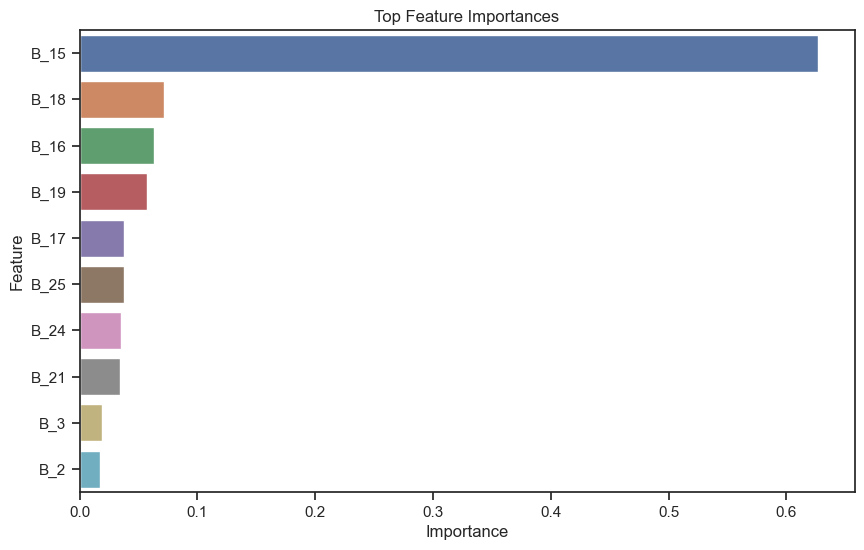

In [318]:
feature_importances = model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top N important features
top_n = 10  # Change to your desired number
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(top_n))
plt.title('Top Feature Importances')
plt.show()

In [283]:
X_test_actual = pd.read_csv('test_data.csv')

In [284]:
for col in X_test_actual.columns: 
    if col in ['timestamp']:
        continue
    X_test_actual[col] = pd.to_numeric(X_test_actual[col], errors = "coerce")

In [285]:
X_test_actual.isnull().sum()

Period Code    79
Cycle ID       86
B_2            81
B_3            68
B_4            68
B_5            83
B_9            88
B_10           94
B_14           80
B_15           96
B_16           71
B_17           72
B_18           78
B_19           77
B_20           77
B_21           84
B_22           72
B_23           78
B_24           79
B_25           69
timestamp       0
dtype: int64

In [286]:
#keep a threshhold of 0.7 for 70%
threshold = 0.7
missing_values_per_row = X_test_actual.isnull().sum(axis=1) / len(X_test_actual.columns)
rows_to_drop = missing_values_per_row > threshold
X_test_actual_cleaned = X_test_actual[~rows_to_drop]

In [287]:
X_test_actual_cleaned.isnull().sum()

Period Code    79
Cycle ID       86
B_2            81
B_3            68
B_4            68
B_5            83
B_9            88
B_10           94
B_14           80
B_15           96
B_16           71
B_17           72
B_18           78
B_19           77
B_20           77
B_21           84
B_22           72
B_23           78
B_24           79
B_25           69
timestamp       0
dtype: int64

In [288]:
while(True):
    X_test_actual_cleaned['Cycle ID'] = X_test_actual_cleaned['Cycle ID'].fillna(X_test_actual_cleaned['Cycle ID'].shift(1) + 1)
    if(X_test_actual_cleaned['Cycle ID'].isnull().sum() == 0):
        break

In [289]:
while(True):
    X_test_actual_cleaned['Period Code'] = X_test_actual_cleaned['Period Code'].fillna(X_test_actual_cleaned['Period Code'].shift(1))
    if(X_test_actual_cleaned['Period Code'].isnull().sum() == 0):
        break

In [290]:
# Define a significance level (alpha)
alpha = 0.05

# Group the data by the 'Cycle ID' column
grouped = X_test_actual_cleaned.groupby('Period Code')

# Define columns to fill based on your conditions
columns_to_fill = []
for col in X_test_actual_cleaned.columns:
    if col not in ['Period Code', 'Cycle ID', 'timestamp', 'Good/Bad']:
        columns_to_fill.append(col)

# Calculate means and modes for the specified columns within each group (cycle)
means = grouped[columns_to_fill].mean()
median = grouped[columns_to_fill].median()

# Iterate over each cycle
for cycle, group in grouped:
    for col in columns_to_fill:
        data = group[col].dropna()  # Remove missing values for the current column
        # Check normality using the Kolmogorov-Smirnov test
        if data.empty:
            continue
        stat, p = stats.kstest(data, 'norm')
        
        if p > alpha:
            # Column appears to be normally distributed, fill with the mean
            X_test_actual_cleaned.loc[group.index, col] = X_test_actual_cleaned.loc[group.index, col].fillna(means.loc[cycle, col])
        else:
            # Column does not appear to be normally distributed, fill with the mode
            X_test_actual_cleaned.loc[group.index, col] = X_test_actual_cleaned.loc[group.index, col].fillna(median.loc[cycle, col])

In [291]:
X_test_actual_cleaned.isnull().sum()

Period Code    0
Cycle ID       0
B_2            0
B_3            0
B_4            0
B_5            0
B_9            0
B_10           0
B_14           0
B_15           0
B_16           0
B_17           0
B_18           0
B_19           0
B_20           0
B_21           0
B_22           0
B_23           0
B_24           0
B_25           0
timestamp      0
dtype: int64

In [292]:
X_test_actual_cleaned2 = X_test_actual_cleaned.drop(['Period Code','Cycle ID','timestamp'],axis = 1)

In [293]:
y_pred_actual = model.predict(X_test_actual_cleaned2)

In [294]:
df = pd.DataFrame(y_pred_actual)

In [295]:
df.to_clipboard()